In [2]:
import os
import cv2
from tqdm import tqdm
from sklearn.utils import shuffle
import numpy as np
from sklearn.model_selection  import train_test_split
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB7
from warnings import filterwarnings
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report,confusion_matrix

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
#Storing Images in X
#Storing labels in Y
X = []
Y = []

labels = ['glioma','notumor','meningioma','pituitary']

In [4]:
path = '/kaggle/input/mri-data12/MRI'
for i in os.listdir(path):
    folder = os.path.join(path ,i)
    for j in labels:
        folder_path = os.path.join(folder, j)
        for x in os.listdir(folder_path):
            img = cv2.imread(os.path.join(folder_path, x))
            img = cv2.resize(img,(224,224))
            X.append(img)
            Y.append(j)

In [5]:
#y stores Numerical indexes of the labels
y = []

for i in Y:
    y.append(labels.index(i))

In [6]:
#Converting List to numpy array
X = np.array(X)
y = np.array(y)
X

array([[[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        [[1, 1, 1],
         [1, 1, 1],
         [1, 1, 1],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        [[2, 2, 2],
         [2, 2, 2],
         [2, 2, 2],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        ...,

        [[2, 2, 2],
         [2, 2, 2],
         [2, 2, 2],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        [[1, 1, 1],
         [1, 1, 1],
         [1, 1, 1],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]]],


       [[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],

        [[0, 0, 0],
         [0,

In [130]:
#One Hot encoding for multiclass classification : converting 1D array to Matrix for clear classification
y = tf.keras.utils.to_categorical(y)
y

array([[[1., 0.],
        [1., 0.],
        [0., 1.],
        [1., 0.]],

       [[1., 0.],
        [1., 0.],
        [0., 1.],
        [1., 0.]],

       [[0., 1.],
        [1., 0.],
        [1., 0.],
        [1., 0.]],

       ...,

       [[1., 0.],
        [0., 1.],
        [1., 0.],
        [1., 0.]],

       [[1., 0.],
        [0., 1.],
        [1., 0.],
        [1., 0.]],

       [[1., 0.],
        [1., 0.],
        [1., 0.],
        [0., 1.]]], dtype=float32)

In [8]:
#to make the dataset more generalised
X, y = shuffle(X,y, random_state=101)

In [9]:
print(X.shape)
print(y.shape)

(7019, 224, 224, 3)
(7019, 4)


In [10]:
#We preprocessed the data at once ,so to segregate into training and testing data, keeping 20% as test
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.2,random_state=101)

In [11]:
#Using Efficient net as our model, using pretrained weights from data set imagenet, and not including the top dense layers so that we can manipulate them according to our data
effnet = EfficientNetB7(weights='imagenet', include_top=False, input_shape=(224,224,3))

258076736/258076736 [==============================] - 1s 0us/step


In [75]:
#Adding our own Dense Layers to better suit 

model = effnet.output
model = tf.keras.layers.GlobalAveragePooling2D()(model)
model = tf.keras.layers.Dropout(rate=0.5)(model)
model = tf.keras.layers.Dense(4,activation='softmax')(model)
model = tf.keras.models.Model(inputs=effnet.input, outputs = model)

In [13]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 224, 224, 3)          7         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 rescaling_1 (Rescaling)     (None, 224, 224, 3)          0         ['normalization[0][0]']   

In [14]:
model.compile(loss='categorical_crossentropy',optimizer = 'Adam', metrics= ['accuracy'])

In [15]:
from keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau

In [16]:
tensorboard = TensorBoard(log_dir = 'logs')
checkpoint = ModelCheckpoint("effnet.h5",monitor="val_accuracy",save_best_only=True,mode="auto",verbose=1)
reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', factor = 0.3, patience = 2, min_delta = 0.001,
                                                            mode='auto',verbose=1)

In [17]:
rm -rf ./logs/

In [18]:
#TO fine tune: We selected an optimum
history = model.fit(X_train,y_train,validation_split=0.1, epochs =12, verbose=1, batch_size=16,
                   callbacks=[tensorboard,checkpoint,reduce_lr])

Epoch 1/12


2024-01-13 22:07:11.825176: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


316/316 [==============================] - ETA: 0s - loss: 0.4051 - accuracy: 0.8636
Epoch 1: val_accuracy improved from -inf to 0.81851, saving model to effnet.h5


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


316/316 [==============================] - 326s 602ms/step - loss: 0.4051 - accuracy: 0.8636 - val_loss: 0.8878 - val_accuracy: 0.8185 - lr: 0.0010
Epoch 2/12
316/316 [==============================] - ETA: 0s - loss: 0.1841 - accuracy: 0.9377
Epoch 2: val_accuracy improved from 0.81851 to 0.93772, saving model to effnet.h5
316/316 [==============================] - 184s 583ms/step - loss: 0.1841 - accuracy: 0.9377 - val_loss: 0.2688 - val_accuracy: 0.9377 - lr: 0.0010
Epoch 3/12
316/316 [==============================] - ETA: 0s - loss: 0.1216 - accuracy: 0.9588
Epoch 3: val_accuracy improved from 0.93772 to 0.97687, saving model to effnet.h5
316/316 [==============================] - 184s 582ms/step - loss: 0.1216 - accuracy: 0.9588 - val_loss: 0.0650 - val_accuracy: 0.9769 - lr: 0.0010
Epoch 4/12
316/316 [==============================] - ETA: 0s - loss: 0.0994 - accuracy: 0.9660
Epoch 4: val_accuracy did not improve from 0.97687
316/316 [==============================] - 181s 573ms

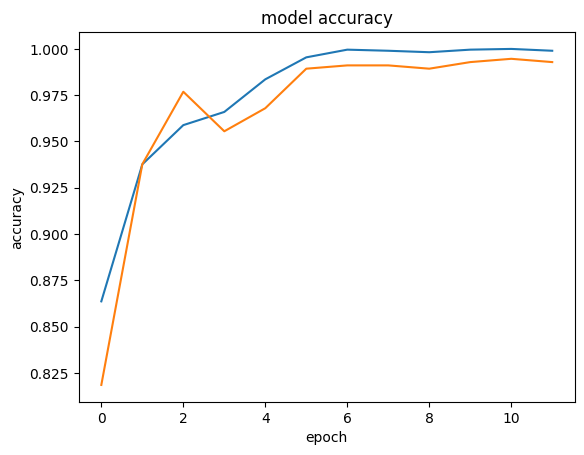

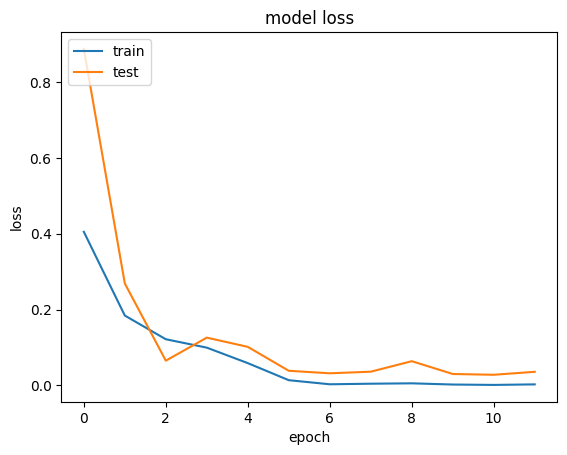

In [19]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [20]:
pred = model.predict(X_test)
pred = np.argmax(pred,axis=1)
y_test_new = np.argmax(y_test,axis=1)

44/44 [==============================] - 16s 222ms/step


In [21]:
print(classification_report(y_test_new,pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98       327
           1       0.98      1.00      0.99       355
           2       0.97      0.99      0.98       360
           3       1.00      0.98      0.99       362

    accuracy                           0.99      1404
   macro avg       0.99      0.98      0.99      1404
weighted avg       0.99      0.99      0.99      1404



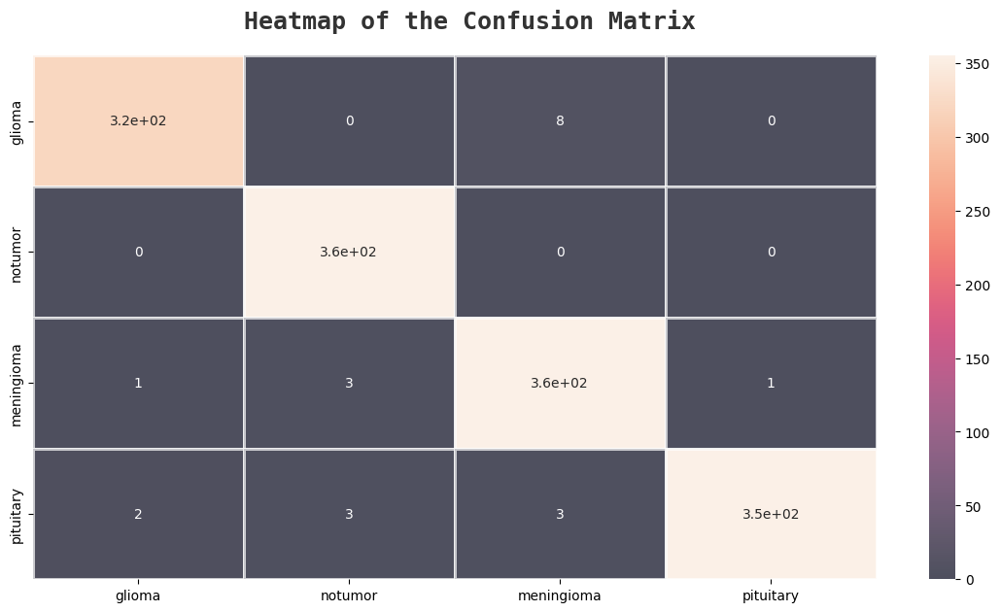

In [22]:
fig,ax=plt.subplots(1,1,figsize=(14,7))
sns.heatmap(confusion_matrix(y_test_new,pred),ax=ax,xticklabels=labels,yticklabels=labels,annot=True,
           alpha=0.7,linewidths=2)
fig.text(s='Heatmap of the Confusion Matrix',size=18,fontweight='bold',
             fontname='monospace',y=0.92,x=0.28,alpha=0.8)

plt.show()

> TASK 2 -Visualizing CNN

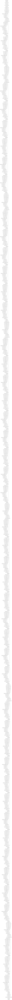

In [24]:
from keras.utils import plot_model

plot_model(model)

In [42]:
test_image = cv2.imread("/kaggle/input/mri-data12/MRI/Testing/glioma/Te-glTr_0009.jpg")
processed_image = cv2.resize(test_image, (224,224))
processed_image = np.array(processed_image)
processed_image = np.expand_dims(processed_image, axis=0)

In [31]:
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, tf.keras.layers.Conv2D)]
activation_model = tf.keras.models.Model(inputs=model.input, outputs=layer_outputs)

In [43]:
activations = activation_model.predict(processed_image)

1/1 [==============================] - 6s 6s/step


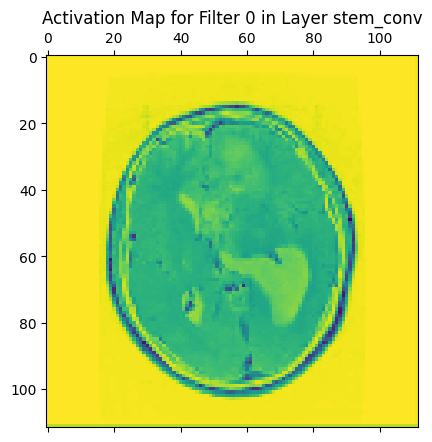

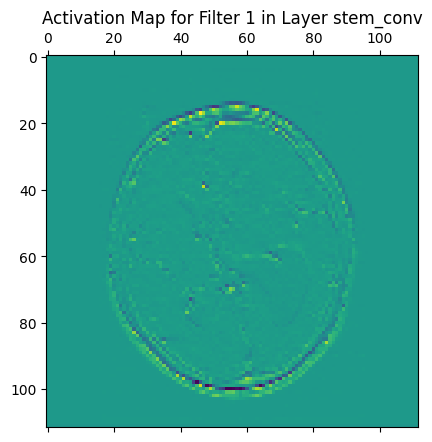

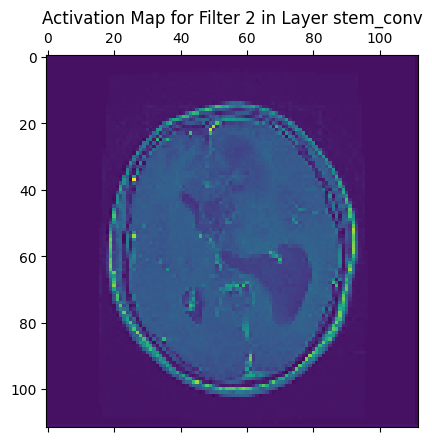

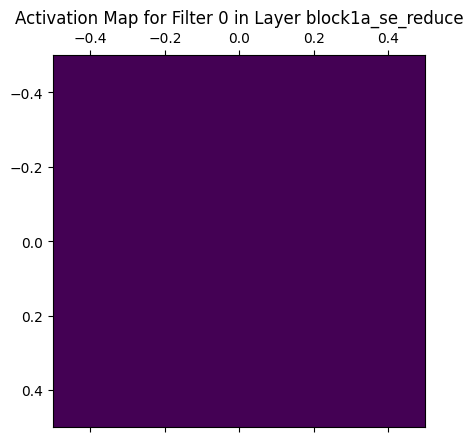

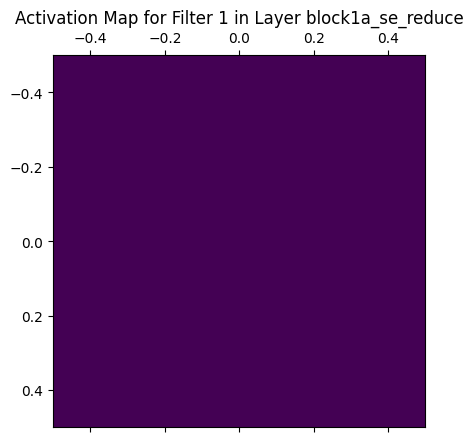

...

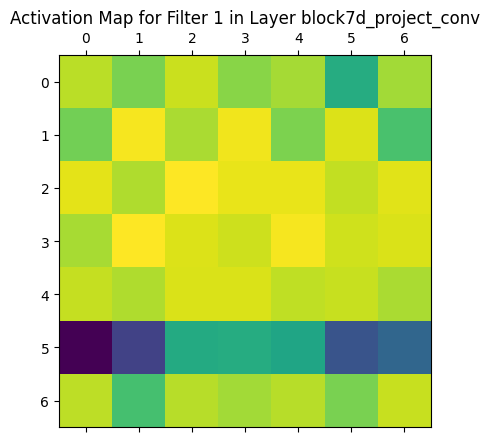

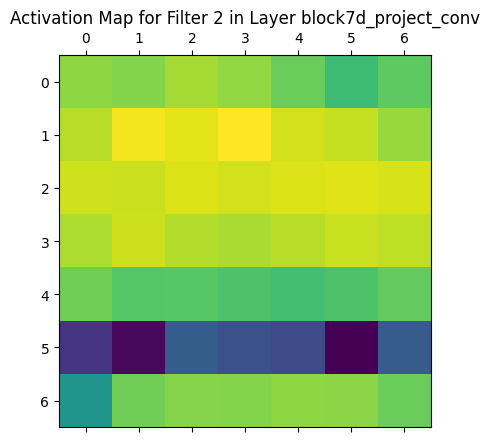

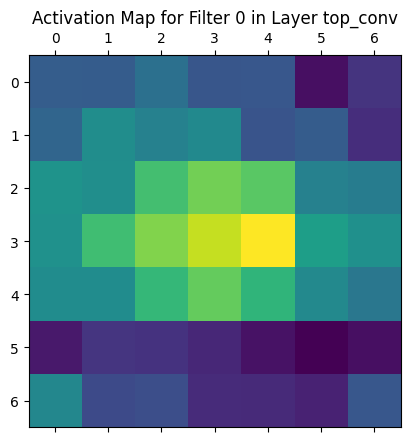

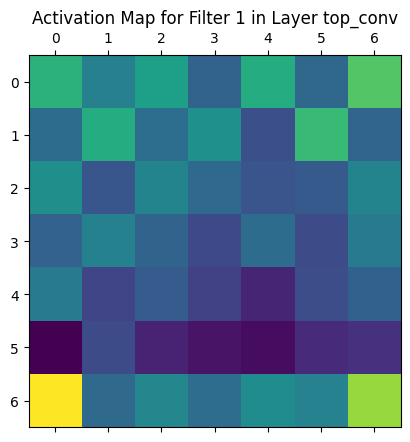

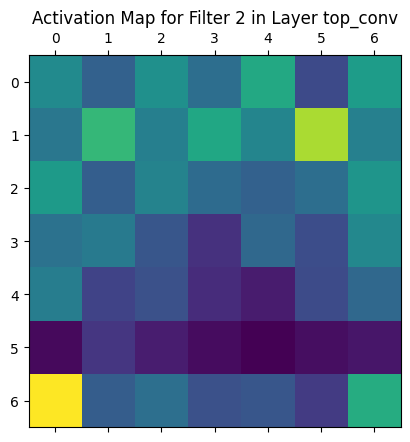

In [164]:
# Extract layer names
layer_names = [layer.name for layer in model.layers if isinstance(layer, tf.keras.layers.Conv2D)]

# Visualize activations
for layer_name, layer_activation in zip(layer_names, activations):
    for i in range(3):  # Visualize three filters
        filter_activation = layer_activation[0, :, :, i]  # Select the ith filter
        plt.matshow(filter_activation, cmap='viridis')
        plt.title(f'Activation Map for Filter {i} in Layer {layer_name}')
        plt.show()


The results we get indicate that as and when we move deeper in the convolution layers the generalization increases and more and more specific features are extracted, the original image starts to lose its originality and becomes percieved as a just an object which is classified into one of the 4 categories rather than being a unique entity
With every Step into the convolution layer, the image losses some of its data due to being filtered and hence the pixelation.
The purple images are  a result of normalization.

In [78]:
layer_names

['stem_conv',
 'block1a_se_reduce',
 'block1a_se_expand',
 'block1a_project_conv',
 'block1b_se_reduce',
 'block1b_se_expand',
 'block1b_project_conv',
 'block1c_se_reduce',
 'block1c_se_expand',
 'block1c_project_conv',
 'block1d_se_reduce',
 'block1d_se_expand',
 'block1d_project_conv',
 'block2a_expand_conv',
 'block2a_se_reduce',
 'block2a_se_expand',
 'block2a_project_conv',
 'block2b_expand_conv',
 'block2b_se_reduce',
 'block2b_se_expand',
 'block2b_project_conv',
 'block2c_expand_conv',
 'block2c_se_reduce',
 'block2c_se_expand',
 'block2c_project_conv',
 'block2d_expand_conv',
 'block2d_se_reduce',
 'block2d_se_expand',
 'block2d_project_conv',
 'block2e_expand_conv',
 'block2e_se_reduce',
 'block2e_se_expand',
 'block2e_project_conv',
 'block2f_expand_conv',
 'block2f_se_reduce',
 'block2f_se_expand',
 'block2f_project_conv',
 'block2g_expand_conv',
 'block2g_se_reduce',
 'block2g_se_expand',
 'block2g_project_conv',
 'block3a_expand_conv',
 'block3a_se_reduce',
 'block3a_se_

> TASK 3 - SALIENCY MAP

In [51]:
preprocessed_image = tf.convert_to_tensor(processed_image)  # Convert to tensor

In [54]:
with tf.GradientTape() as tape:  # Create a new tape for each calculation
    class_scores = model(preprocessed_image)  # Get class scores
    top_class = tf.argmax(class_scores[0])  # Identify the top-predicted class
    top_class_score = class_scores[0][top_class]  # Extract the score for that class

    saliency_map = tape.gradient(top_class_score, preprocessed_image)


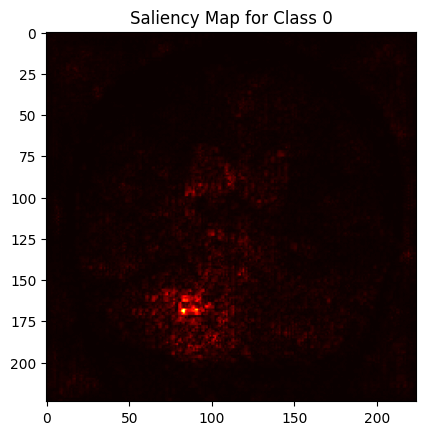

In [455]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt


def generate_saliency_map(image_path):
    """Generates a saliency map for a given image."""

    # Load and preprocess the image
    img = image.load_img(image_path, target_size=(224, 224))  # Adjust target size as needed
    x = image.img_to_array(img)
    x = tf.expand_dims(x, axis=0)
    preprocessed_image = tf.keras.applications.efficientnet.preprocess_input(x)  # Adjust preprocessing as needed

    with tf.GradientTape() as tape:
        tape.watch(preprocessed_image)  # Watch the input image
        class_scores = model(preprocessed_image)  # Get class scores
        top_class = tf.argmax(class_scores[0])  # Identify the top-predicted class
        top_class_score = class_scores[0][top_class]  # Extract the score for that class

    saliency_map = tape.gradient(top_class_score, preprocessed_image)
    
    # Create saliency map by taking maximum absolute value across channels
    saliency_map = tf.reduce_max(tf.abs(saliency_map), axis=-1)

    
    if saliency_map is not None:
        saliency_map = tf.squeeze(saliency_map)  # Remove batch dimension if present
        saliency_map = (saliency_map - tf.reduce_min(saliency_map)) / (
            tf.reduce_max(saliency_map) - tf.reduce_min(saliency_map)
        )  # Normalize for visualization
        plt.imshow(saliency_map, cmap='hot')  # Display saliency map
        plt.title(f'Saliency Map for Class {top_class}')
        plt.show()
    else:
        print("Gradient calculation failed. Check model architecture and input values.")

# Example usage:
image_path = '/kaggle/input/mri-data12/MRI/Testing/meningioma/Te-me_0020.jpg'  # Replace with actual image path
generate_saliency_map(image_path)

> TASK 4 - CLASS REPRESENTATIVE GRAPH

In [466]:
logits_model = tf.keras.Model(inputs=model.inputs, outputs=model.layers[-2].output)  # Access logits


def compute_representative_image(class_index, num_iterations, learning_rate, l2_reg_lambda):
    image = tf.random.normal((1, 224, 224, 3))  # Adjust shape as needed
    initial_logits = logits_model(tf.random.normal((1, 224, 224, 3)))
    print("Initial logits: ", initial_logits)

    for _ in range(num_iterations):
        with tf.GradientTape() as tape:
            tape.watch(image)
            logits = logits_model(image)
            score_c = logits[:, class_index]
            l2_norm = tf.norm(image)**2
            objective = score_c - l2_reg_lambda * l2_norm
            print(objective," ",image)
        gradients = tape.gradient(objective, image)
        
        # Check if gradients are None
        if gradients is None:
            print("Gradients are None. Check the computation graph!")
            break

        image = image + learning_rate * gradients

    return image



In [467]:
num_classes =  4 # Adjust based on your model
representative_images = []
for class_index in range(num_classes):
    image = compute_representative_image(class_index, 10, 0.01, 0.001)  # Tune hyperparameters
    representative_images.append(image)


Initial logits:  tf.Tensor([[0.00402998 0.         0.00228994 ... 0.02246695 0.         0.        ]], shape=(1, 1024), dtype=float32)
tf.Tensor([-150.84508], shape=(1,), dtype=float32)   tf.Tensor(
[[[[ 6.1864042e-01 -1.7434541e+00  1.3286816e-01]
   [ 5.3870398e-01  1.7277588e+00  4.1684386e-01]
   [-1.9995607e-01 -7.2108775e-01  2.1297938e-01]
   ...
   [ 1.1877594e+00  1.3240241e-01 -8.5492402e-01]
   [ 4.7566196e-01 -7.2096461e-01  1.3732940e+00]
   [ 3.9526328e-01 -1.5162043e-01 -2.0681550e-01]]

  [[ 1.4896556e+00  5.5621509e-02  3.4329155e-01]
   [-8.8141763e-01  5.4934464e-02 -2.7396217e-01]
   [-1.5470197e+00  8.5802567e-01 -1.6126579e+00]
   ...
   [ 6.0804993e-01  7.5165993e-01  1.6344604e+00]
   [ 1.4217283e-01 -1.7022047e+00 -9.2688030e-01]
   [ 8.2140911e-01 -1.4381462e+00  5.9321648e-01]]

  [[ 3.5694948e-01 -9.3480283e-01  9.7071338e-01]
   [ 2.5977898e-01 -2.7186155e-02 -1.1381257e+00]
   [-1.1575875e+00  9.5323497e-01  6.1645931e-01]
   ...
   [ 1.2387676e-01 -6.04929

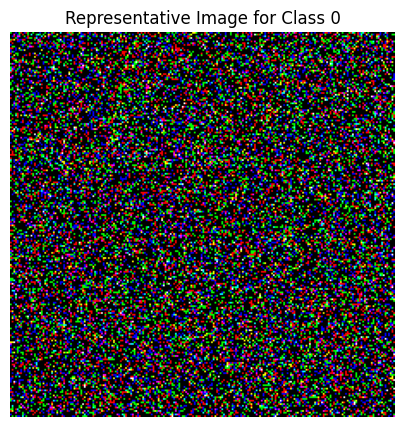

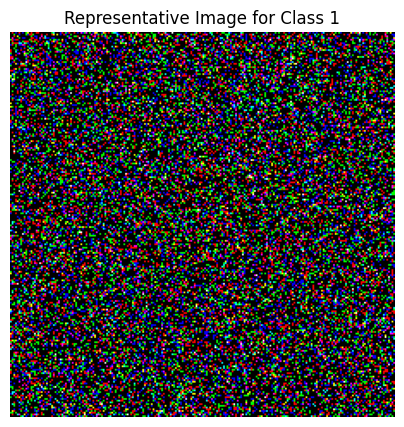

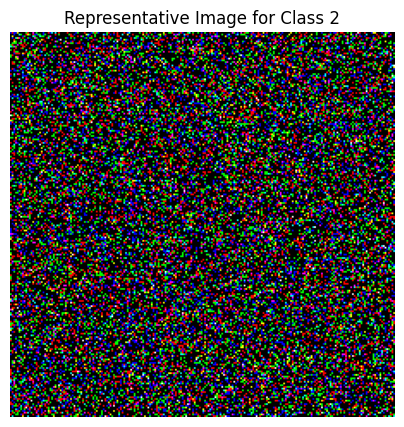

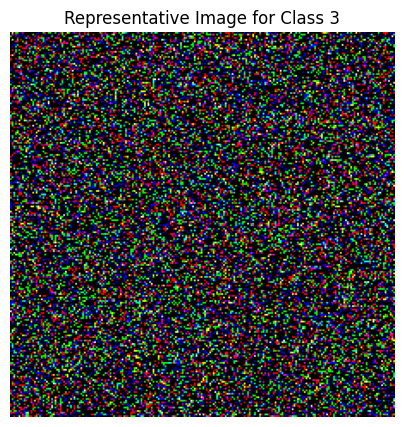

In [482]:
# Display the representative images
for i, image in enumerate(representative_images):
    plt.figure(figsize=(5, 5))
    plt.imshow(image[0].numpy().astype("uint8"))  # Convert to uint8 for display
    plt.title(f"Representative Image for Class {i}")
    plt.axis("off")
    plt.show()

> TASK 5- GRAD_CAM

In [273]:
!pip install imutils

  Preparing metadata (setup.py) ... done
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25837 sha256=afdb9fb427b1294cd705f38f8373fe216dc23a72662c787ef2c260b0ec1b0c7a
  Stored in directory: /root/.cache/pip/wheels/85/cf/3a/e265e975a1e7c7e54eb3692d6aa4e2e7d6a3945d29da46f2d7
Successfully built imutils


In [470]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications import imagenet_utils
from tensorflow.keras.models import Model
import numpy as np
import imutils
import cv2

In [405]:
model1 = VGG16(weights="imagenet")

In [471]:
orig = cv2.imread("/kaggle/input/mri-data12/MRI/Testing/meningioma/Te-me_0028.jpg")
resized=cv2.resize(orig,(224,224))

In [472]:
image = load_img("/kaggle/input/mri-data12/MRI/Testing/meningioma/Te-me_0028.jpg", target_size=(224,224))
image = img_to_array(image)
image = np.expand_dims(image,axis=0)
image = imagenet_utils.preprocess_input(image)

In [473]:
# use the network to make predictions on the input image and find
# the class label index with the largest corresponding probability
preds = model.predict(image)
i=np.argmax(preds[0])

1/1 [==============================] - 0s 40ms/step


In [474]:
import numpy as np

CLASS_INDEX = None  # Initialize CLASS_INDEX in the global scope


def decode_predictions(preds, top=5):
    """Decodes the prediction of an ImageNet model.

    # Arguments
        preds: Numpy tensor encoding a batch of predictions.
        top: Integer, how many top-guesses to return.

    # Returns
        A list of lists of top class prediction tuples
        `(class_name, class_description, score)`.
        One list of tuples per sample in batch input.

    # Raises
        ValueError: In case of invalid shape of the `pred` array
            (must be 2D).
    """
    CLASS_INDEX = None  # Initialize CLASS_INDEX in the global scope

    if len(preds.shape) != 2 or preds.shape[1] != 4:
        raise ValueError(
            "`decode_predictions` expects "
            "a batch of predictions "
            "(i.e. a 2D array of shape (samples, 4)). "
            "Found array with shape: " + str(preds.shape)
        )
    if CLASS_INDEX is None:
        CLASS_INDEX = {
            0: 'glioma',
            2: 'notumor',
            1: 'meningioma',
            3: 'pituitary'
        }
    results = []
    for pred in preds:
        top_indices = pred.argsort()[-top:][::-1]
# In decode_predictions function:
        result = [(i, CLASS_INDEX[i], pred[i]) for i in top_indices]  # Add index or other information
        results.append(result)
    return results


In [475]:
decoded = decode_predictions(preds)
print(decoded[0][0])
(imagenetID, label, prob) = decoded[0][0]
label = "{}: {:.2f}%".format(label, prob * 100)
print("[INFO] {}".format(label))

(0, 'glioma', 0.25511748)
[INFO] glioma: 25.51%


In [476]:
# import the necessary packages
from tensorflow.keras.models import Model
import tensorflow as tf
import numpy as np
import cv2
class GradCAM:
    def __init__(self, model, classIdx, layerName=None):
        # store the model, the class index used to measure the class
        # activation map, and the layer to be used when visualizing
        # the class activation map
        self.model = model
        self.classIdx = classIdx
        self.layerName = layerName
        # if the layer name is None, attempt to automatically find
        # the target output layer
        if self.layerName is None:
            self.layerName = self.find_target_layer()
            
    def find_target_layer(self):
    # attempt to find the final convolutional layer in the network
    # by looping over the layers of the network in reverse order
        for layer in reversed(self.model.layers):
        # check to see if the layer has a 4D output
            if len(layer.output_shape) == 4:
                return layer.name
    # otherwise, we could not find a 4D layer so the GradCAM
    # algorithm cannot be applied
        raise ValueError("Could not find 4D layer. Cannot apply GradCAM.")


    def compute_heatmap(self, image, eps=1e-8):
        
# construct our gradient model by supplying (1) the inputs
# to our pre-trained model, (2) the output of the (presumably)
# final 4D layer in the network, and (3) the output of the
# softmax activations from the model
        gradModel = Model(
        inputs=[self.model.inputs],
        outputs=[self.model.get_layer(self.layerName).output,
        self.model.output])

    # record operations for automatic differentiation
        with tf.GradientTape() as tape:
    # cast the image tensor to a float-32 data type, pass the
    # image through the gradient model, and grab the loss
    # associated with the specific class index
            inputs = tf.cast(image, tf.float32)
            (convOutputs, predictions) = gradModel(inputs)
            loss = predictions[:, self.classIdx]

    # use automatic differentiation to compute the gradients
        grads = tape.gradient(loss, convOutputs)


    # compute the guided gradients
        castConvOutputs = tf.cast(convOutputs > 0, "float32")
        castGrads = tf.cast(grads > 0, "float32")
        guidedGrads = castConvOutputs * castGrads * grads
    # the convolution and guided gradients have a batch dimension
    # (which we don't need) so let's grab the volume itself and
    # discard the batch
        convOutputs = convOutputs[0]
        guidedGrads = guidedGrads[0]


        # compute the average of the gradient values, and using them
        # as weights, compute the ponderation of the filters with
        # respect to the weights
        weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
        cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)


        # grab the spatial dimensions of the input image and resize
        # the output class activation map to match the input image
        # dimensions
        (w, h) = (image.shape[2], image.shape[1])
        heatmap = cv2.resize(cam.numpy(), (w, h))
        # normalize the heatmap such that all values lie in the range
        # [0, 1], scale the resulting values to the range [0, 255],
        # and then convert to an unsigned 8-bit integer
        numer = heatmap - np.min(heatmap)
        denom = (heatmap.max() - heatmap.min()) + eps
        heatmap = numer / denom
        heatmap = (heatmap * 255).astype("uint8")
        # return the resulting heatmap to the calling function
        return heatmap
    def overlay_heatmap(self, heatmap, image, alpha=0.5,colormap=cv2.COLORMAP_VIRIDIS):
        # apply the supplied color map to the heatmap and then
        # overlay the heatmap on the input image
        heatmap = cv2.applyColorMap(heatmap, colormap)
        output = cv2.addWeighted(image, alpha, heatmap, 1 - alpha, 0)
        # return a 2-tuple of the color mapped heatmap and the output,
        # overlaid image
        return (heatmap, output)

In [477]:
# initialize our gradient class activation map and build the heatmap
cam = GradCAM(model, i)
heatmap = cam.compute_heatmap(preprocessed_image)
# resize the resulting heatmap to the original input image dimensions
# and then overlay heatmap on top of the image
heatmap = cv2.resize(heatmap, (orig.shape[1], orig.shape[0]))
(heatmap, output) = cam.overlay_heatmap(heatmap,orig , alpha=0.5)

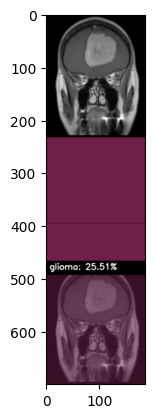

In [478]:
cv2.rectangle(output,(0,0),(340,40),(0,0,0),-1)
cv2.putText(output,label,(10,25),cv2.FONT_HERSHEY_SIMPLEX,0.8,(255,255,255),2)
heatmap = np.squeeze(heatmap)  # Example: If heatmap is (1, height, width)
output = np.vstack([orig, heatmap, output])

# output = np.vstack([orig,heatmap,output])
output = imutils.resize(output,height=700)
import matplotlib.pyplot as plt
plt.imshow(output)
plt.show()